## Verify Ground Truth ##

Given cut-out regions from brightfield images, paired with MPM images, verify the location of the MPM region within the brightfield image. Ground Truth coordinates taken from the annotated brightfield images are read from a csv file and mapped to the location within the cut-out regions by subtracting the location of the cut-out (from another csv).

In [1]:
import numpy as np
import matplotlib.pyplot as plt #requires Pillow to read tiffs
from skimage.color import rgb2gray
from PIL import Image
from sklearn.metrics import mutual_info_score, adjusted_mutual_info_score


In [2]:
brightfield_folder = '/media/jo/Data_NTFS/rois/'
brightfield_filename = '%d_%d.tif' #substitute slide number and region id

mpm_folder = '../data/processed/'
mpm_filename = '%d_%d_gs.tif' #substitute slide number and region id

cutout_metadatafile = brightfield_folder + 'roi_locations.csv'
gt_metadatafile = './gt_roi_locations.csv'

In [3]:
cutout_locations = np.genfromtxt(cutout_metadatafile, delimiter=',', dtype=None, encoding="utf8")
cutout_locations = cutout_locations.astype(int) #Convert to integers

gt_positions = np.genfromtxt(gt_metadatafile, delimiter=',', dtype=None, encoding="utf8")
gt_positions = gt_positions[1:].astype(int) #Drop header row, convert to integers

For each region in roi_locations, open the corresponding brightfield and MPM images and register.

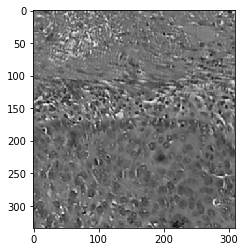

(512, 512, 4)
255
30


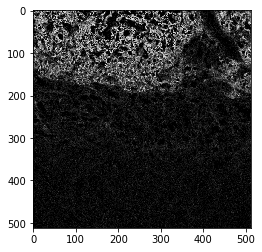

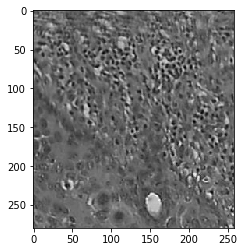

(512, 512, 4)
255
16


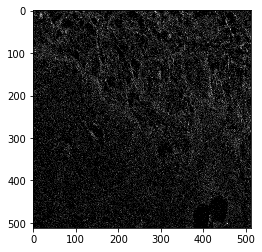

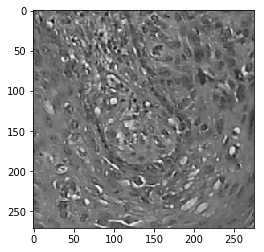

(512, 512, 4)
255
15


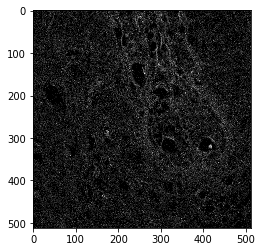

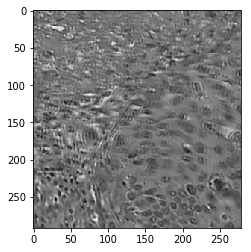

(512, 512, 4)
255
30


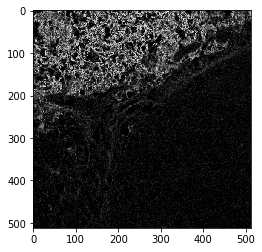

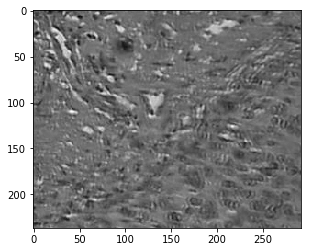

(512, 512, 4)
255
28


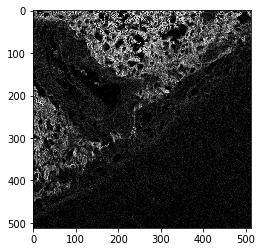

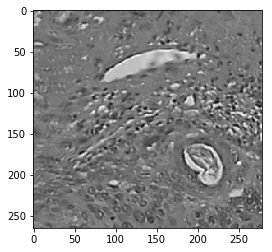

(512, 512, 4)
255
32


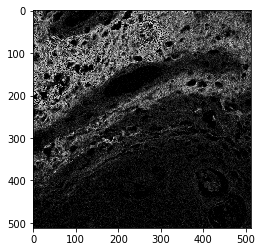

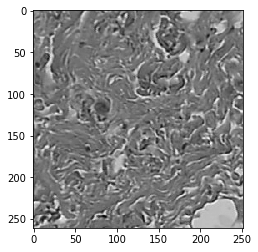

MPM image not found for region 7 of slide 148184


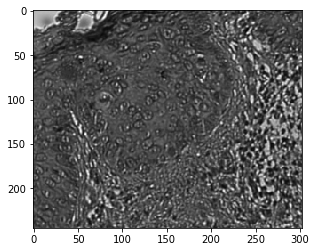

(512, 512, 4)
255
32


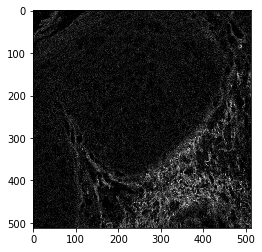

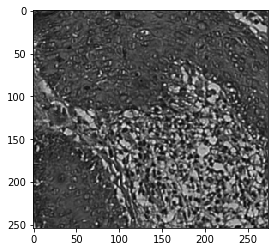

(512, 512, 4)
255
21


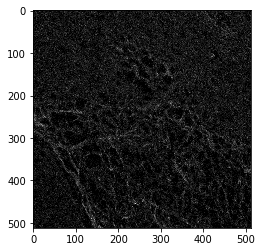

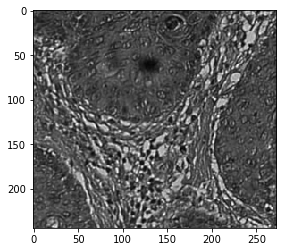

(512, 512, 4)
255
34


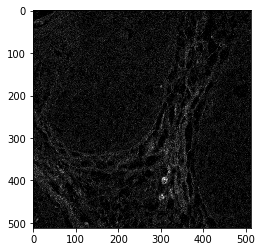

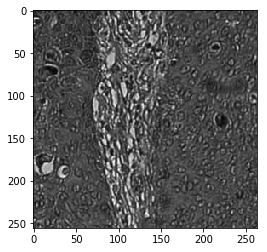

(512, 512, 4)
255
26


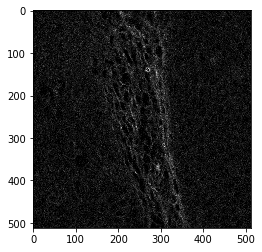

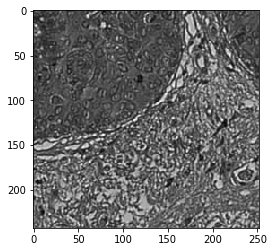

(512, 512, 4)
255
28


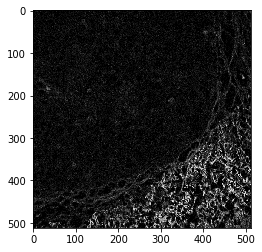

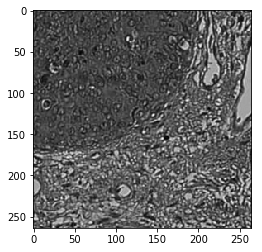

(512, 512, 4)
255
28


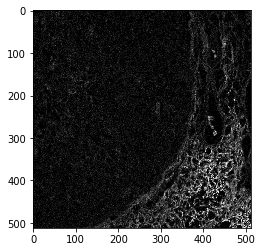

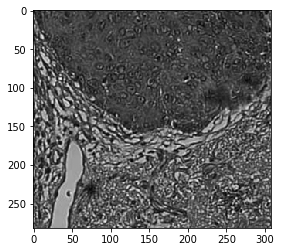

(512, 512, 4)
255
30


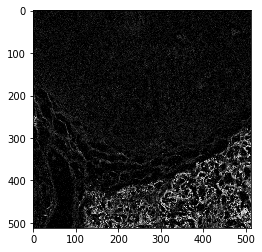

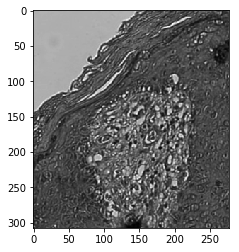

(512, 512, 4)
255
26


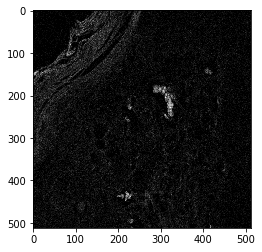

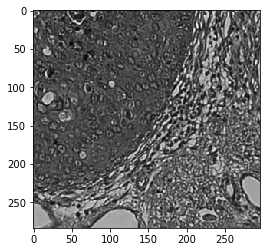

(512, 512, 4)
255
26


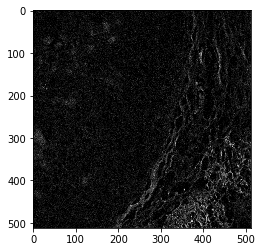

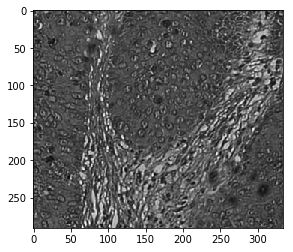

(512, 512, 4)
255
26


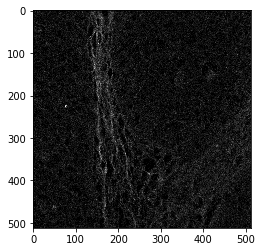

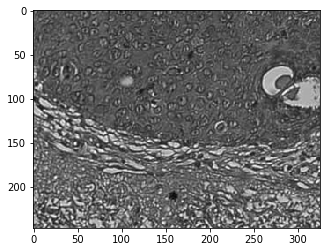

(512, 512, 4)
255
28


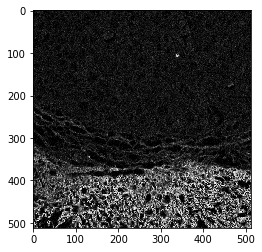

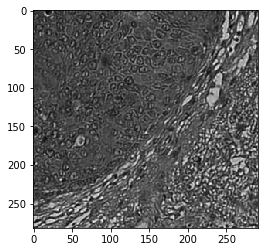

(512, 512, 4)
255
32


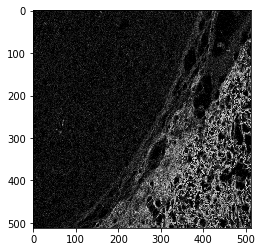

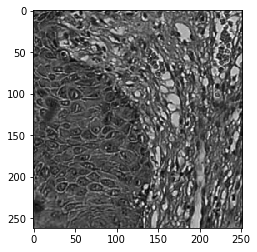

(512, 512, 4)
255
28


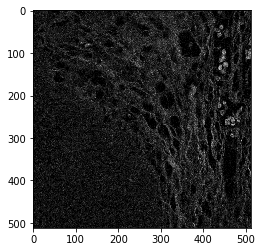

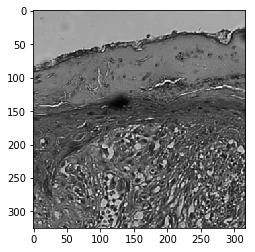

(512, 512, 4)
255
21


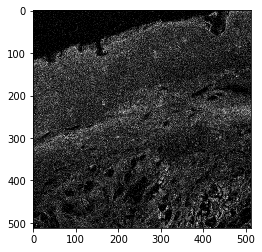

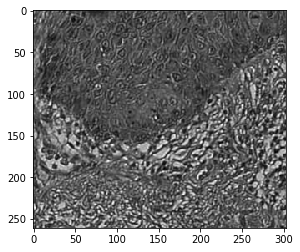

(512, 512, 4)
255
29


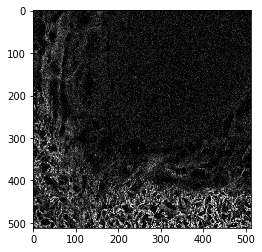

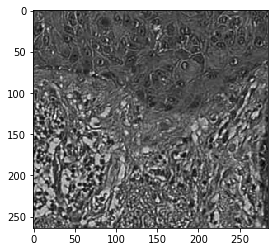

(512, 512, 4)
255
40


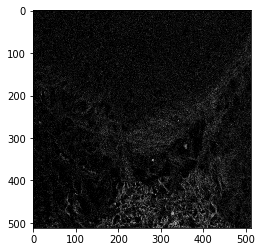

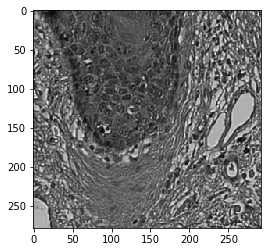

(512, 512, 4)
255
28


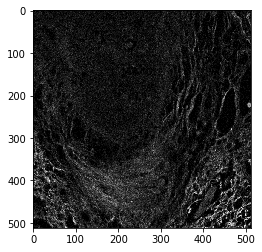

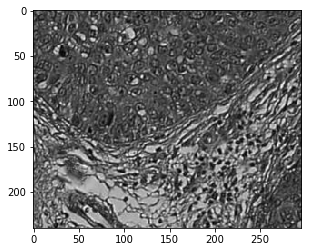

(512, 512, 4)
255
26


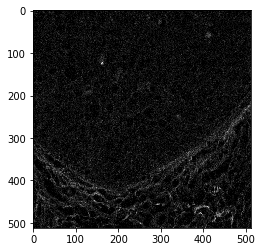

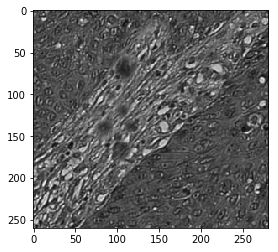

(512, 512, 4)
255
24


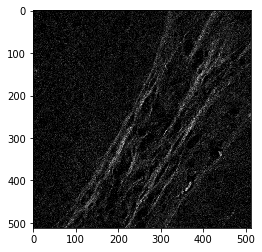

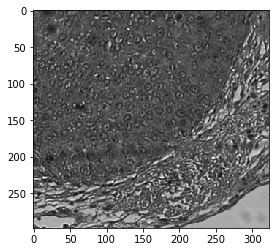

(512, 512, 4)
255
30


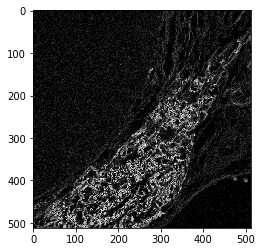

In [4]:
for region in cutout_locations:
    slide_id = region[0]
    region_id = region[1]
    region_coords = (region[2:4], region[4:])
    #print("Registering images for region %d on slide %d with coords %r"%(region_id, slide_id, region_coords))
    try:
        ref_im = plt.imread(brightfield_folder+brightfield_filename%(slide_id,region_id))
    except:
        print("Brightfield image not found for region %d of slide %d"%(region_id, slide_id))
        continue
    ref_im = np.rint(rgb2gray(ref_im)*255.).astype('uint8')
    plt.imshow(ref_im, cmap='gray')
    plt.show()
    
    try:
        flo_im = plt.imread(mpm_folder+mpm_filename%(slide_id,region_id))
    except:
        print("MPM image not found for region %d of slide %d"%(region_id, slide_id))
        continue
    print(flo_im.shape)
    print(np.max(flo_im))
    flo_im = np.rint(rgb2gray(flo_im)*255.).astype('uint8')
    print(np.max(flo_im))
    plt.imshow(flo_im, cmap='gray')
    plt.show()
    

In [5]:
512 * 1.5

768.0

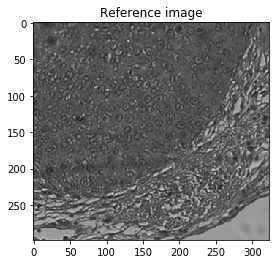

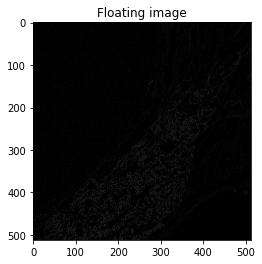

Finding maximum MI on a grid of (20 x 109 x 117) = 255060 points
New max found at scale (0.529, 0.529) and translation (-10.000, -10.000)
Ranges: (0, 0, 298, 323) (10, 10, 261, 261)
Overlap pixels: (261, 261)
MI: 0.0354 	AMI: 0.0009


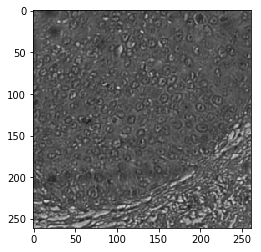

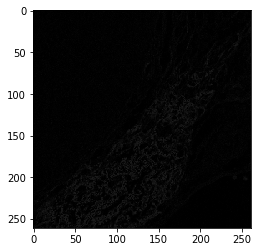

New max found at scale (0.529, 0.529) and translation (-10.000, -8.000)
Ranges: (0, 0, 298, 323) (10, 8, 261, 263)
Overlap pixels: (261, 263)
MI: 0.0365 	AMI: 0.0012


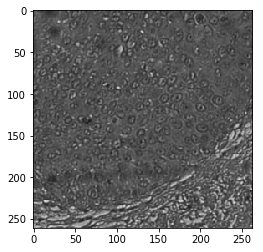

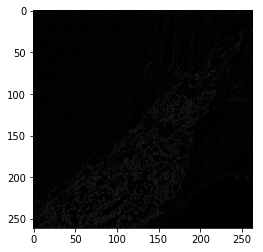

New max found at scale (0.529, 0.529) and translation (-10.000, -7.000)
Ranges: (0, 0, 298, 323) (10, 7, 261, 264)
Overlap pixels: (261, 264)
MI: 0.0369 	AMI: 0.0013


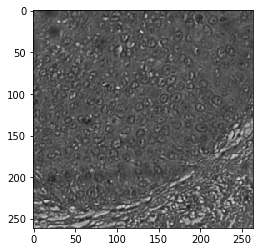

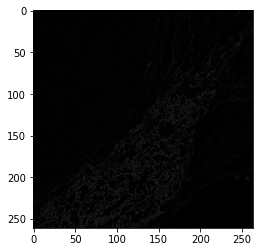

New max found at scale (0.529, 0.529) and translation (-10.000, 51.000)
Ranges: (0, 51, 298, 272) (10, 0, 261, 271)
Overlap pixels: (261, 271)
MI: 0.0370 	AMI: 0.0012


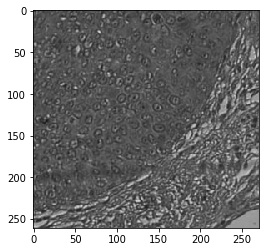

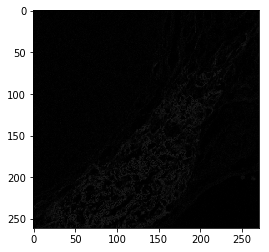

New max found at scale (0.529, 0.529) and translation (-10.000, 52.000)
Ranges: (0, 52, 298, 271) (10, 0, 261, 271)
Overlap pixels: (261, 271)
MI: 0.0380 	AMI: 0.0014


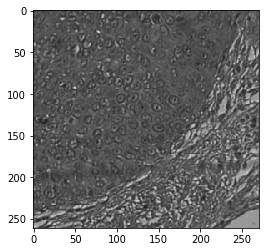

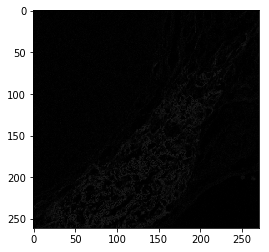

New max found at scale (0.529, 0.529) and translation (-10.000, 53.000)
Ranges: (0, 53, 298, 270) (10, 0, 261, 271)
Overlap pixels: (261, 270)
MI: 0.0384 	AMI: 0.0015


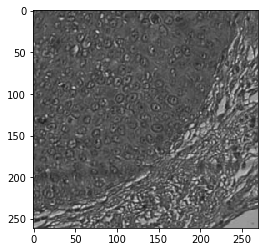

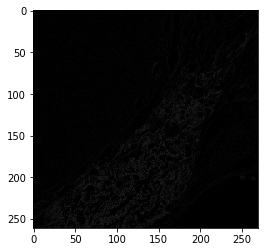

New max found at scale (0.529, 0.529) and translation (-10.000, 54.000)
Ranges: (0, 54, 298, 269) (10, 0, 261, 271)
Overlap pixels: (261, 269)
MI: 0.0391 	AMI: 0.0016


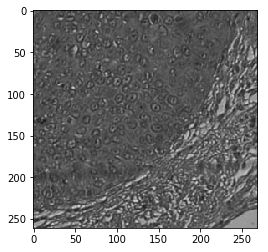

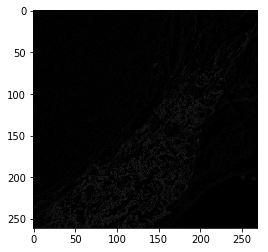

New max found at scale (0.529, 0.529) and translation (-10.000, 56.000)
Ranges: (0, 56, 298, 267) (10, 0, 261, 271)
Overlap pixels: (261, 267)
MI: 0.0402 	AMI: 0.0018


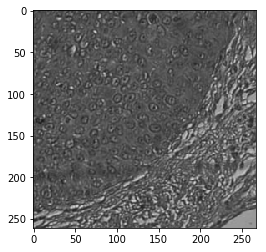

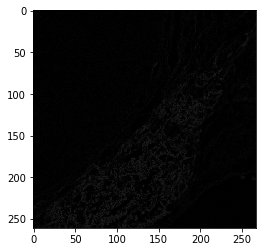

New max found at scale (0.529, 0.529) and translation (-10.000, 60.000)
Ranges: (0, 60, 298, 263) (10, 0, 261, 271)
Overlap pixels: (261, 263)
MI: 0.0403 	AMI: 0.0017


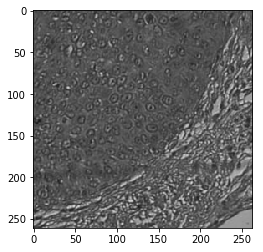

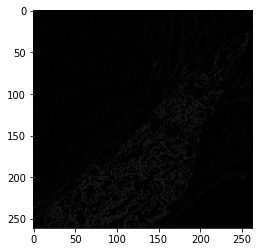

New max found at scale (0.529, 0.529) and translation (-10.000, 61.000)
Ranges: (0, 61, 298, 262) (10, 0, 261, 271)
Overlap pixels: (261, 262)
MI: 0.0406 	AMI: 0.0018


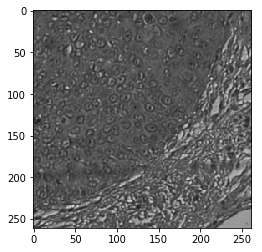

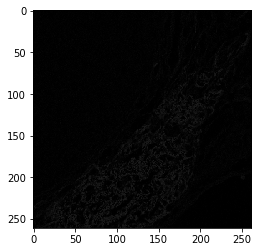

New max found at scale (0.529, 0.529) and translation (-10.000, 65.000)
Ranges: (0, 65, 298, 258) (10, 0, 261, 271)
Overlap pixels: (261, 258)
MI: 0.0415 	AMI: 0.0019


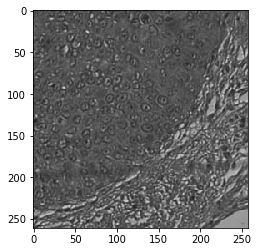

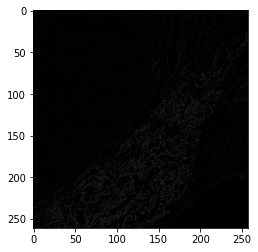

New max found at scale (0.529, 0.529) and translation (-10.000, 67.000)
Ranges: (0, 67, 298, 256) (10, 0, 261, 271)
Overlap pixels: (261, 256)
MI: 0.0435 	AMI: 0.0023


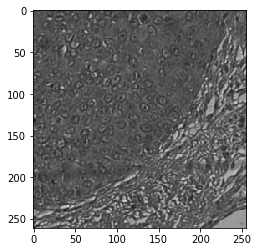

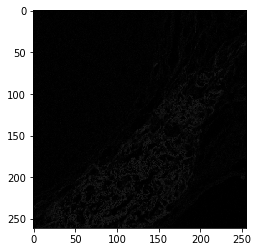

New max found at scale (0.529, 0.529) and translation (-10.000, 68.000)
Ranges: (0, 68, 298, 255) (10, 0, 261, 271)
Overlap pixels: (261, 255)
MI: 0.0437 	AMI: 0.0023


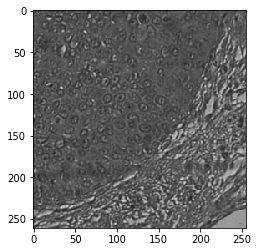

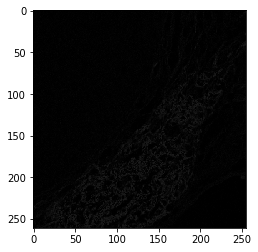

New max found at scale (0.529, 0.529) and translation (-10.000, 69.000)
Ranges: (0, 69, 298, 254) (10, 0, 261, 271)
Overlap pixels: (261, 254)
MI: 0.0447 	AMI: 0.0025


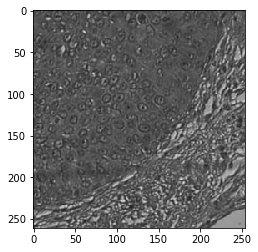

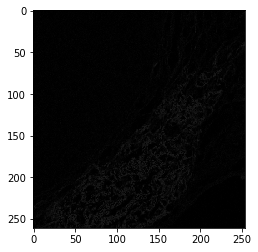

New max found at scale (0.529, 0.529) and translation (-10.000, 71.000)
Ranges: (0, 71, 298, 252) (10, 0, 261, 271)
Overlap pixels: (261, 252)
MI: 0.0462 	AMI: 0.0028


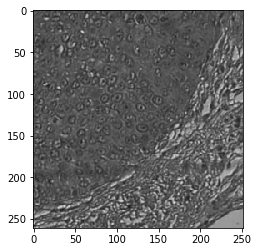

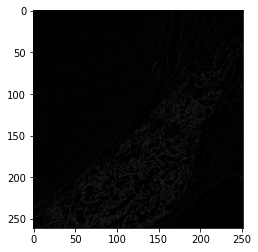

New max found at scale (0.529, 0.529) and translation (-10.000, 78.000)
Ranges: (0, 78, 298, 245) (10, 0, 261, 271)
Overlap pixels: (261, 245)
MI: 0.0480 	AMI: 0.0030


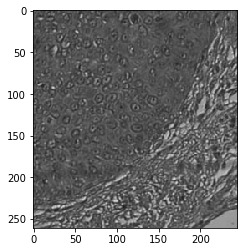

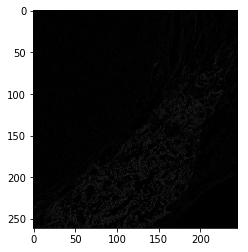

New max found at scale (0.529, 0.529) and translation (-10.000, 79.000)
Ranges: (0, 79, 298, 244) (10, 0, 261, 271)
Overlap pixels: (261, 244)
MI: 0.0488 	AMI: 0.0031


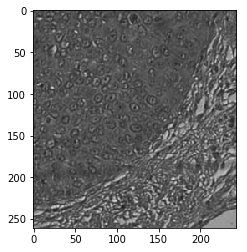

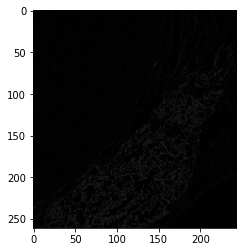

New max found at scale (0.529, 0.529) and translation (-10.000, 83.000)
Ranges: (0, 83, 298, 240) (10, 0, 261, 271)
Overlap pixels: (261, 240)
MI: 0.0504 	AMI: 0.0034


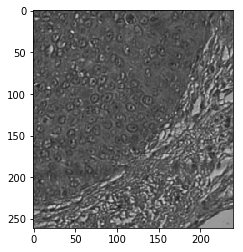

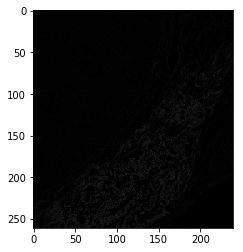

New max found at scale (0.529, 0.529) and translation (-10.000, 87.000)
Ranges: (0, 87, 298, 236) (10, 0, 261, 271)
Overlap pixels: (261, 236)
MI: 0.0507 	AMI: 0.0033


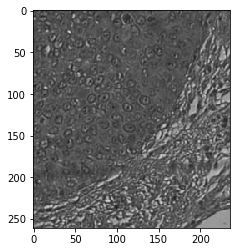

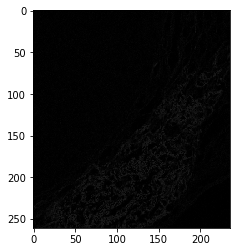

New max found at scale (0.529, 0.529) and translation (-10.000, 88.000)
Ranges: (0, 88, 298, 235) (10, 0, 261, 271)
Overlap pixels: (261, 235)
MI: 0.0509 	AMI: 0.0033


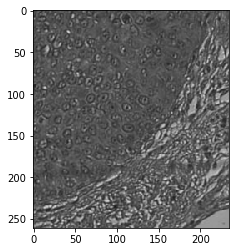

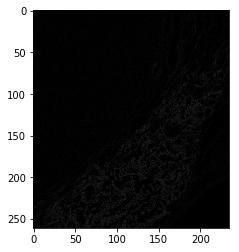

New max found at scale (0.529, 0.529) and translation (-10.000, 89.000)
Ranges: (0, 89, 298, 234) (10, 0, 261, 271)
Overlap pixels: (261, 234)
MI: 0.0524 	AMI: 0.0036


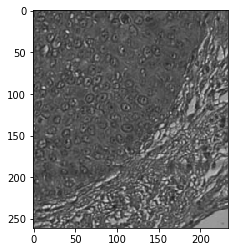

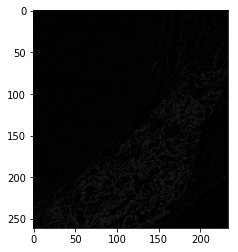

New max found at scale (0.529, 0.529) and translation (-10.000, 90.000)
Ranges: (0, 90, 298, 233) (10, 0, 261, 271)
Overlap pixels: (261, 233)
MI: 0.0526 	AMI: 0.0036


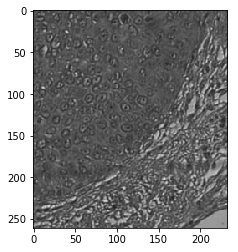

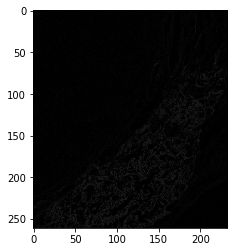

New max found at scale (0.529, 0.529) and translation (-10.000, 92.000)
Ranges: (0, 92, 298, 231) (10, 0, 261, 271)
Overlap pixels: (261, 231)
MI: 0.0527 	AMI: 0.0035


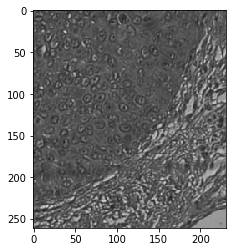

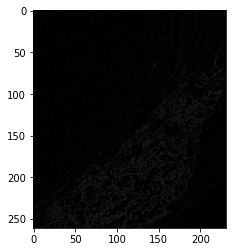

New max found at scale (0.529, 0.529) and translation (-10.000, 93.000)
Ranges: (0, 93, 298, 230) (10, 0, 261, 271)
Overlap pixels: (261, 230)
MI: 0.0554 	AMI: 0.0041


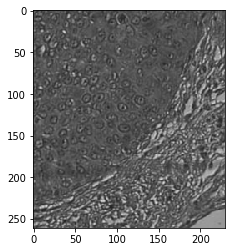

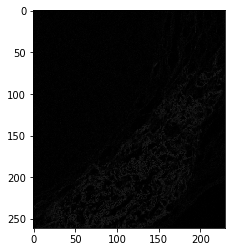

New max found at scale (0.529, 0.529) and translation (-10.000, 94.000)
Ranges: (0, 94, 298, 229) (10, 0, 261, 271)
Overlap pixels: (261, 229)
MI: 0.0564 	AMI: 0.0043


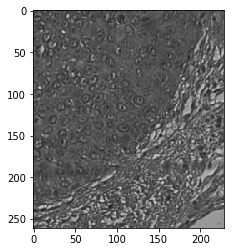

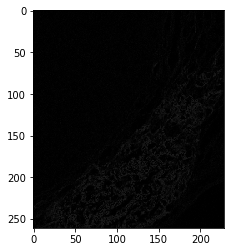

New max found at scale (0.529, 0.529) and translation (-10.000, 95.000)
Ranges: (0, 95, 298, 228) (10, 0, 261, 271)
Overlap pixels: (261, 228)
MI: 0.0565 	AMI: 0.0043


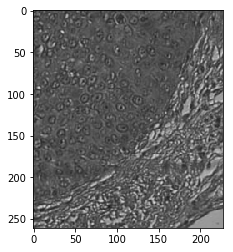

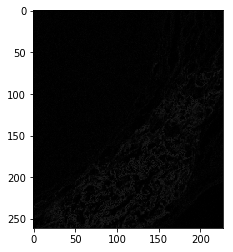

New max found at scale (0.529, 0.529) and translation (-10.000, 96.000)
Ranges: (0, 96, 298, 227) (10, 0, 261, 271)
Overlap pixels: (261, 227)
MI: 0.0565 	AMI: 0.0042


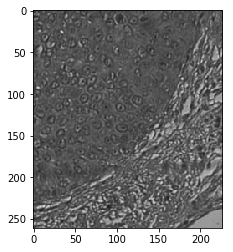

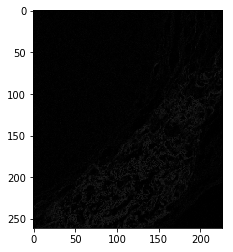

New max found at scale (0.529, 0.529) and translation (-10.000, 97.000)
Ranges: (0, 97, 298, 226) (10, 0, 261, 271)
Overlap pixels: (261, 226)
MI: 0.0580 	AMI: 0.0045


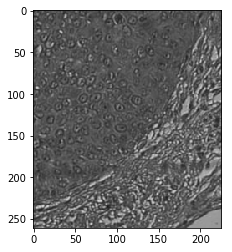

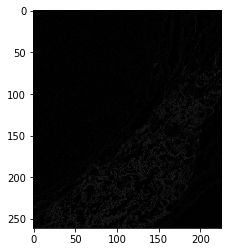

New max found at scale (0.529, 0.529) and translation (-10.000, 99.000)
Ranges: (0, 99, 298, 224) (10, 0, 261, 271)
Overlap pixels: (261, 224)
MI: 0.0586 	AMI: 0.0046


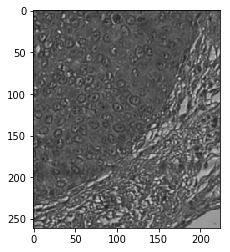

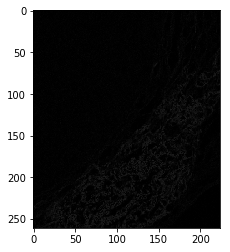

New max found at scale (0.529, 0.529) and translation (-10.000, 100.000)
Ranges: (0, 100, 298, 223) (10, 0, 261, 271)
Overlap pixels: (261, 223)
MI: 0.0608 	AMI: 0.0050


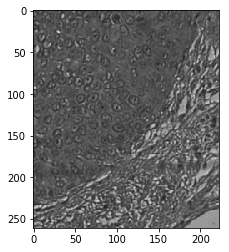

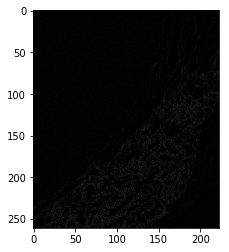

New max found at scale (0.529, 0.529) and translation (-10.000, 101.000)
Ranges: (0, 101, 298, 222) (10, 0, 261, 271)
Overlap pixels: (261, 222)
MI: 0.0624 	AMI: 0.0054


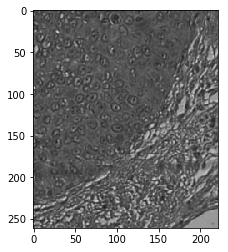

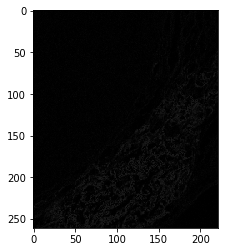

New max found at scale (0.529, 0.529) and translation (-10.000, 102.000)
Ranges: (0, 102, 298, 221) (10, 0, 261, 271)
Overlap pixels: (261, 221)
MI: 0.0630 	AMI: 0.0055


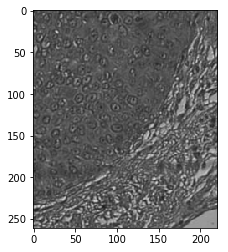

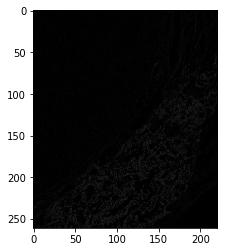

New max found at scale (0.529, 0.529) and translation (-10.000, 103.000)
Ranges: (0, 103, 298, 220) (10, 0, 261, 271)
Overlap pixels: (261, 220)
MI: 0.0645 	AMI: 0.0058


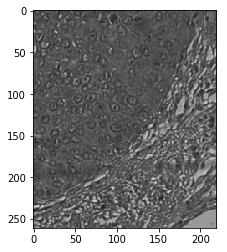

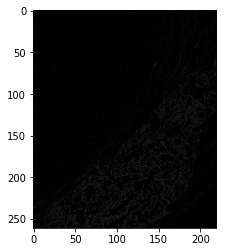

New max found at scale (0.529, 0.529) and translation (-8.000, 104.000)
Ranges: (0, 104, 298, 219) (8, 0, 263, 271)
Overlap pixels: (263, 219)
MI: 0.0655 	AMI: 0.0060


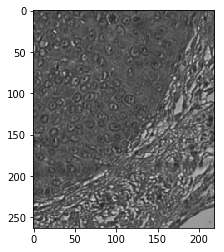

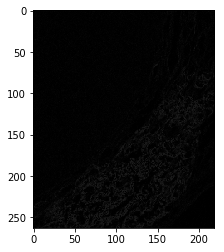

At grid point 1000 (0.4%): scale (0.529, 0.529), translation (-2, 53). MI=0.041, AMI=0.002
New max found at scale (0.529, 0.529) and translation (-1.000, 106.000)
Ranges: (0, 106, 298, 217) (1, 0, 270, 271)
Overlap pixels: (270, 217)
MI: 0.0654 	AMI: 0.0061


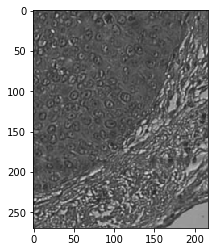

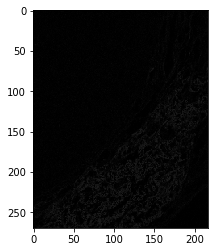

New max found at scale (0.529, 0.529) and translation (0.000, 106.000)
Ranges: (0, 106, 298, 217) (0, 0, 271, 271)
Overlap pixels: (271, 217)
MI: 0.0667 	AMI: 0.0064


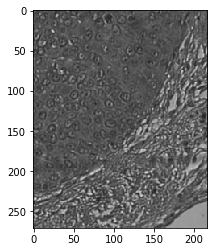

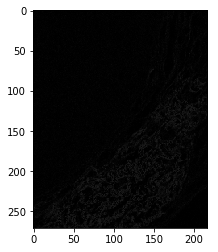

New max found at scale (0.529, 0.529) and translation (3.000, 104.000)
Ranges: (3, 104, 295, 219) (0, 0, 271, 271)
Overlap pixels: (271, 219)
MI: 0.0670 	AMI: 0.0066


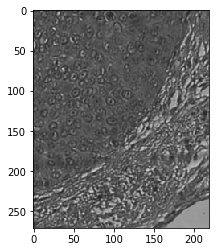

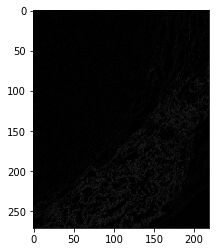

New max found at scale (0.529, 0.529) and translation (3.000, 105.000)
Ranges: (3, 105, 295, 218) (0, 0, 271, 271)
Overlap pixels: (271, 218)
MI: 0.0682 	AMI: 0.0068


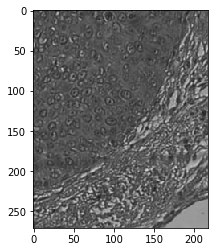

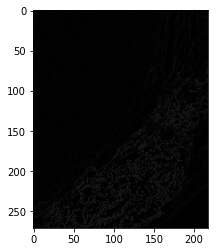

New max found at scale (0.529, 0.529) and translation (4.000, 105.000)
Ranges: (4, 105, 294, 218) (0, 0, 271, 271)
Overlap pixels: (271, 218)
MI: 0.0691 	AMI: 0.0070


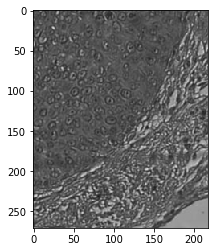

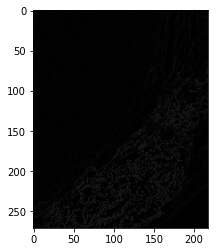

New max found at scale (0.529, 0.529) and translation (5.000, 104.000)
Ranges: (5, 104, 293, 219) (0, 0, 271, 271)
Overlap pixels: (271, 219)
MI: 0.0696 	AMI: 0.0071


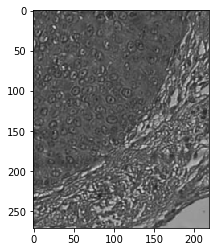

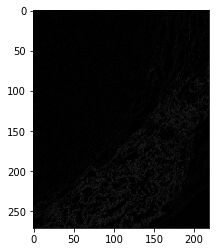

At grid point 2000 (0.8%): scale (0.529, 0.529), translation (7, 0). MI=0.034, AMI=0.001
At grid point 3000 (1.2%): scale (0.529, 0.529), translation (15, 64). MI=0.052, AMI=0.004
At grid point 4000 (1.6%): scale (0.529, 0.529), translation (24, 11). MI=0.041, AMI=0.002
New max found at scale (0.529, 0.529) and translation (29.000, 70.000)
Ranges: (29, 70, 269, 253) (0, 0, 271, 271)
Overlap pixels: (269, 253)
MI: 0.0656 	AMI: 0.0071


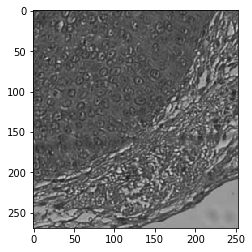

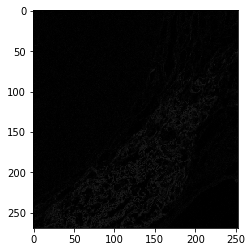

At grid point 5000 (2.0%): scale (0.529, 0.529), translation (32, 75). MI=0.062, AMI=0.006
At grid point 6000 (2.4%): scale (0.529, 0.529), translation (41, 22). MI=0.047, AMI=0.003
At grid point 7000 (2.7%): scale (0.529, 0.529), translation (49, 86). MI=0.052, AMI=0.003
At grid point 8000 (3.1%): scale (0.529, 0.529), translation (58, 33). MI=0.051, AMI=0.004
At grid point 9000 (3.5%): scale (0.529, 0.529), translation (66, 97). MI=0.057, AMI=0.003
At grid point 10000 (3.9%): scale (0.529, 0.529), translation (75, 44). MI=0.047, AMI=0.002
At grid point 11000 (4.3%): scale (0.529, 0.529), translation (84, -9). MI=0.048, AMI=0.002
At grid point 12000 (4.7%): scale (0.529, 0.529), translation (92, 55). MI=0.045, AMI=0.001
New max found at scale (0.551, 0.551) and translation (-10.000, 105.000)
Ranges: (0, 105, 298, 218) (10, 0, 272, 282)
Overlap pixels: (272, 218)
MI: 0.0715 	AMI: 0.0075


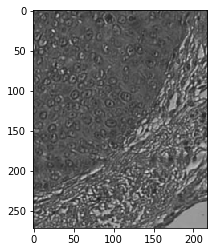

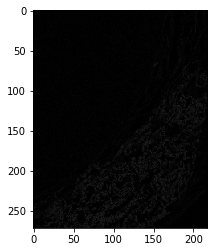

New max found at scale (0.551, 0.551) and translation (-10.000, 106.000)
Ranges: (0, 106, 298, 217) (10, 0, 272, 282)
Overlap pixels: (272, 217)
MI: 0.0715 	AMI: 0.0074


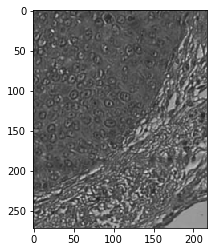

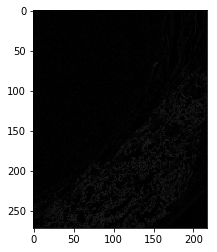

New max found at scale (0.551, 0.551) and translation (-9.000, 105.000)
Ranges: (0, 105, 298, 218) (9, 0, 273, 282)
Overlap pixels: (273, 218)
MI: 0.0721 	AMI: 0.0076


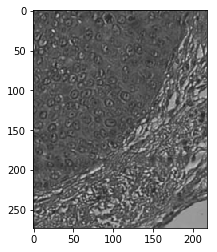

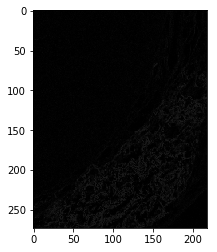

New max found at scale (0.551, 0.551) and translation (-9.000, 106.000)
Ranges: (0, 106, 298, 217) (9, 0, 273, 282)
Overlap pixels: (273, 217)
MI: 0.0724 	AMI: 0.0077


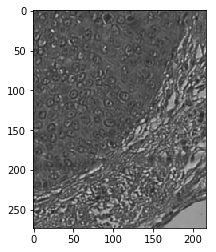

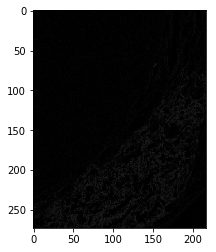

At grid point 13000 (5.1%): scale (0.551, 0.551), translation (-8, 2). MI=0.033, AMI=0.001
At grid point 14000 (5.5%): scale (0.551, 0.551), translation (0, 66). MI=0.051, AMI=0.004
At grid point 15000 (5.9%): scale (0.551, 0.551), translation (9, 13). MI=0.037, AMI=0.002
At grid point 16000 (6.3%): scale (0.551, 0.551), translation (17, 77). MI=0.063, AMI=0.007
At grid point 17000 (6.7%): scale (0.551, 0.551), translation (26, 24). MI=0.049, AMI=0.004
At grid point 18000 (7.1%): scale (0.551, 0.551), translation (34, 88). MI=0.053, AMI=0.004
At grid point 19000 (7.4%): scale (0.551, 0.551), translation (43, 35). MI=0.050, AMI=0.004
At grid point 20000 (7.8%): scale (0.551, 0.551), translation (51, 99). MI=0.059, AMI=0.004
At grid point 21000 (8.2%): scale (0.551, 0.551), translation (60, 46). MI=0.045, AMI=0.003
At grid point 22000 (8.6%): scale (0.551, 0.551), translation (69, -7). MI=0.043, AMI=0.002
At grid point 23000 (9.0%): scale (0.551, 0.551), translation (77, 57). MI=0.045, A

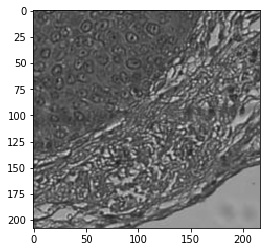

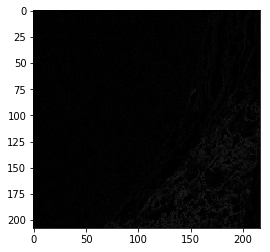

New max found at scale (0.551, 0.551) and translation (91.000, 106.000)
Ranges: (91, 106, 207, 217) (0, 0, 282, 282)
Overlap pixels: (207, 217)
MI: 0.0738 	AMI: 0.0059


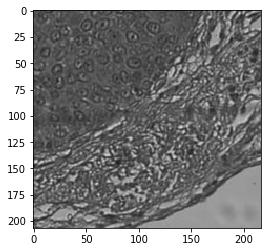

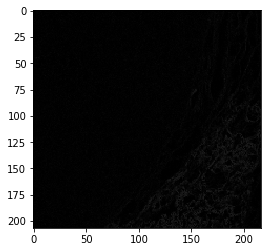

New max found at scale (0.551, 0.551) and translation (93.000, 106.000)
Ranges: (93, 106, 205, 217) (0, 0, 282, 282)
Overlap pixels: (205, 217)
MI: 0.0752 	AMI: 0.0061


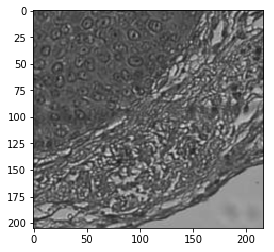

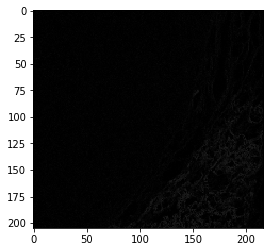

At grid point 25000 (9.8%): scale (0.551, 0.551), translation (94, 68). MI=0.047, AMI=0.001
At grid point 26000 (10.2%): scale (0.573, 0.573), translation (-6, 15). MI=0.035, AMI=0.002
At grid point 27000 (10.6%): scale (0.573, 0.573), translation (2, 79). MI=0.058, AMI=0.006
At grid point 28000 (11.0%): scale (0.573, 0.573), translation (11, 26). MI=0.047, AMI=0.004
At grid point 29000 (11.4%): scale (0.573, 0.573), translation (19, 90). MI=0.053, AMI=0.004
At grid point 30000 (11.8%): scale (0.573, 0.573), translation (28, 37). MI=0.049, AMI=0.004
At grid point 31000 (12.2%): scale (0.573, 0.573), translation (36, 101). MI=0.062, AMI=0.005
At grid point 32000 (12.5%): scale (0.573, 0.573), translation (45, 48). MI=0.047, AMI=0.003
At grid point 33000 (12.9%): scale (0.573, 0.573), translation (54, -5). MI=0.042, AMI=0.002
At grid point 34000 (13.3%): scale (0.573, 0.573), translation (62, 59). MI=0.044, AMI=0.002
At grid point 35000 (13.7%): scale (0.573, 0.573), translation (71, 6).

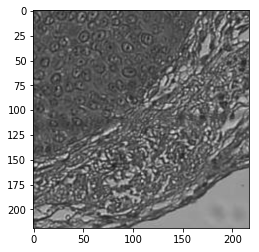

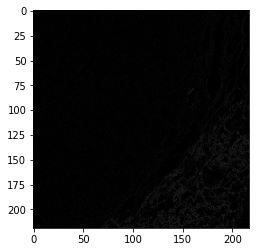

New max found at scale (0.573, 0.573) and translation (81.000, 105.000)
Ranges: (81, 105, 217, 218) (0, 0, 293, 293)
Overlap pixels: (217, 218)
MI: 0.0775 	AMI: 0.0071


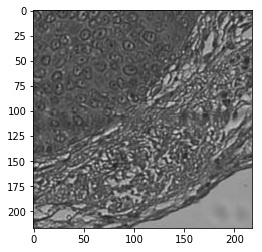

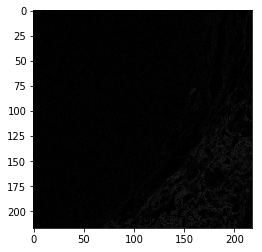

New max found at scale (0.573, 0.573) and translation (81.000, 106.000)
Ranges: (81, 106, 217, 217) (0, 0, 293, 293)
Overlap pixels: (217, 217)
MI: 0.0779 	AMI: 0.0072


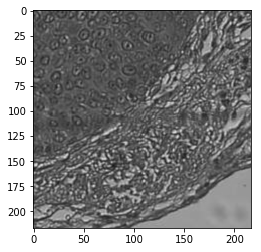

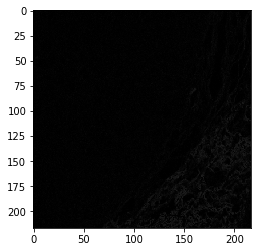

New max found at scale (0.573, 0.573) and translation (83.000, 106.000)
Ranges: (83, 106, 215, 217) (0, 0, 293, 293)
Overlap pixels: (215, 217)
MI: 0.0793 	AMI: 0.0074


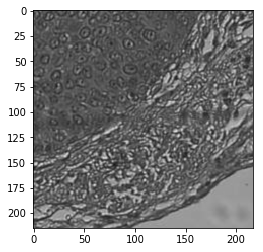

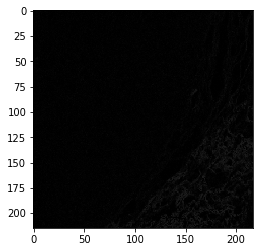

New max found at scale (0.573, 0.573) and translation (85.000, 106.000)
Ranges: (85, 106, 213, 217) (0, 0, 293, 293)
Overlap pixels: (213, 217)
MI: 0.0806 	AMI: 0.0077


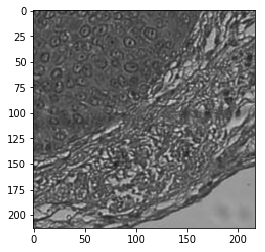

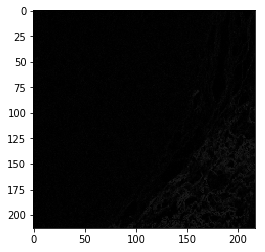

At grid point 37000 (14.5%): scale (0.573, 0.573), translation (88, 17). MI=0.042, AMI=0.002
At grid point 38000 (14.9%): scale (0.573, 0.573), translation (96, 81). MI=0.058, AMI=0.003
At grid point 39000 (15.3%): scale (0.595, 0.595), translation (-4, 28). MI=0.049, AMI=0.005
At grid point 40000 (15.7%): scale (0.595, 0.595), translation (4, 92). MI=0.058, AMI=0.005
At grid point 41000 (16.1%): scale (0.595, 0.595), translation (13, 39). MI=0.050, AMI=0.005
At grid point 42000 (16.5%): scale (0.595, 0.595), translation (21, 103). MI=0.066, AMI=0.006
New max found at scale (0.595, 0.595) and translation (28.000, 106.000)
Ranges: (28, 106, 270, 217) (0, 0, 305, 305)
Overlap pixels: (270, 217)
MI: 0.0741 	AMI: 0.0079


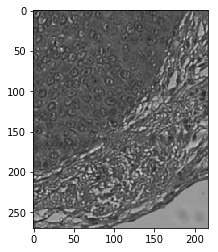

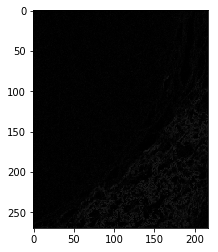

At grid point 43000 (16.9%): scale (0.595, 0.595), translation (30, 50). MI=0.044, AMI=0.003
At grid point 44000 (17.3%): scale (0.595, 0.595), translation (39, -3). MI=0.040, AMI=0.003
At grid point 45000 (17.6%): scale (0.595, 0.595), translation (47, 61). MI=0.046, AMI=0.003
At grid point 46000 (18.0%): scale (0.595, 0.595), translation (56, 8). MI=0.039, AMI=0.002
New max found at scale (0.595, 0.595) and translation (57.000, 106.000)
Ranges: (57, 106, 241, 217) (0, 0, 305, 305)
Overlap pixels: (241, 217)
MI: 0.0783 	AMI: 0.0080


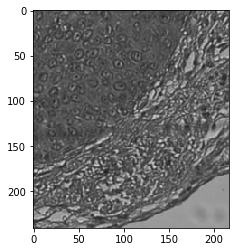

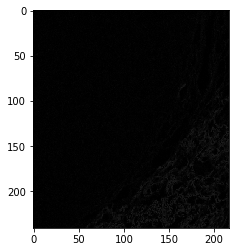

New max found at scale (0.595, 0.595) and translation (60.000, 106.000)
Ranges: (60, 106, 238, 217) (0, 0, 305, 305)
Overlap pixels: (238, 217)
MI: 0.0791 	AMI: 0.0081


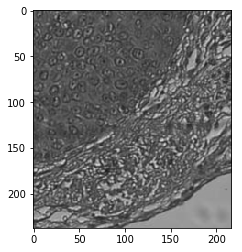

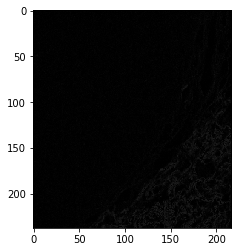

New max found at scale (0.595, 0.595) and translation (61.000, 106.000)
Ranges: (61, 106, 237, 217) (0, 0, 305, 305)
Overlap pixels: (237, 217)
MI: 0.0796 	AMI: 0.0082


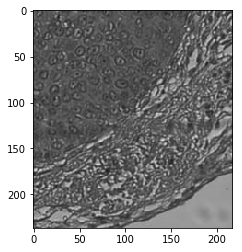

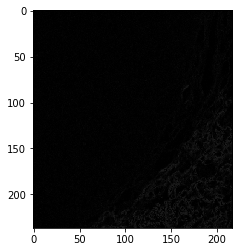

New max found at scale (0.595, 0.595) and translation (63.000, 106.000)
Ranges: (63, 106, 235, 217) (0, 0, 305, 305)
Overlap pixels: (235, 217)
MI: 0.0799 	AMI: 0.0082


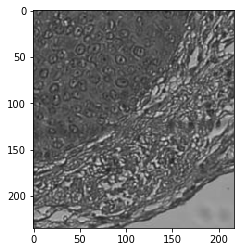

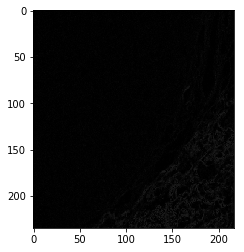

At grid point 47000 (18.4%): scale (0.595, 0.595), translation (64, 72). MI=0.052, AMI=0.003
New max found at scale (0.595, 0.595) and translation (64.000, 106.000)
Ranges: (64, 106, 234, 217) (0, 0, 305, 305)
Overlap pixels: (234, 217)
MI: 0.0802 	AMI: 0.0083


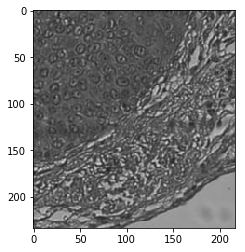

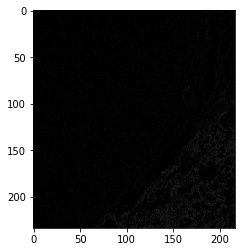

New max found at scale (0.595, 0.595) and translation (67.000, 106.000)
Ranges: (67, 106, 231, 217) (0, 0, 305, 305)
Overlap pixels: (231, 217)
MI: 0.0816 	AMI: 0.0085


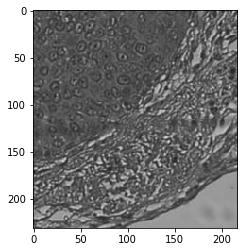

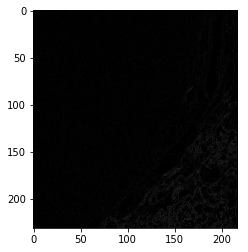

New max found at scale (0.595, 0.595) and translation (69.000, 106.000)
Ranges: (69, 106, 229, 217) (0, 0, 305, 305)
Overlap pixels: (229, 217)
MI: 0.0822 	AMI: 0.0086


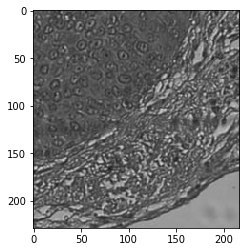

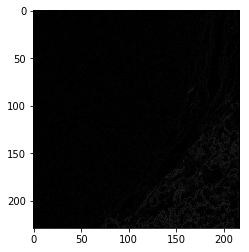

New max found at scale (0.595, 0.595) and translation (70.000, 106.000)
Ranges: (70, 106, 228, 217) (0, 0, 305, 305)
Overlap pixels: (228, 217)
MI: 0.0847 	AMI: 0.0091


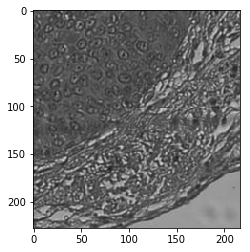

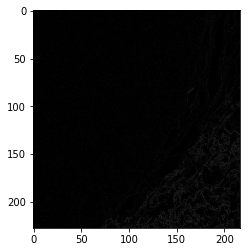

New max found at scale (0.595, 0.595) and translation (72.000, 106.000)
Ranges: (72, 106, 226, 217) (0, 0, 305, 305)
Overlap pixels: (226, 217)
MI: 0.0847 	AMI: 0.0090


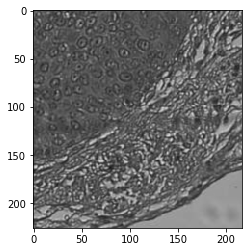

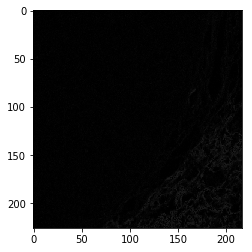

At grid point 48000 (18.8%): scale (0.595, 0.595), translation (73, 19). MI=0.038, AMI=0.001
New max found at scale (0.595, 0.595) and translation (74.000, 104.000)
Ranges: (74, 104, 224, 219) (0, 0, 305, 305)
Overlap pixels: (224, 219)
MI: 0.0849 	AMI: 0.0091


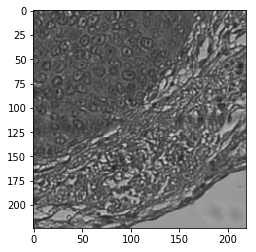

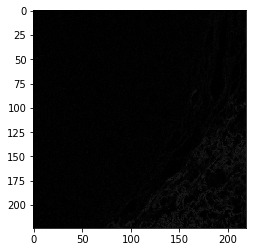

At grid point 49000 (19.2%): scale (0.595, 0.595), translation (81, 83). MI=0.060, AMI=0.004
At grid point 50000 (19.6%): scale (0.595, 0.595), translation (90, 30). MI=0.042, AMI=0.002
New max found at scale (0.595, 0.595) and translation (95.000, 103.000)
Ranges: (95, 103, 203, 220) (0, 0, 305, 305)
Overlap pixels: (203, 220)
MI: 0.0857 	AMI: 0.0088


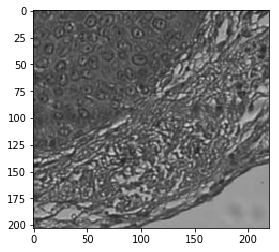

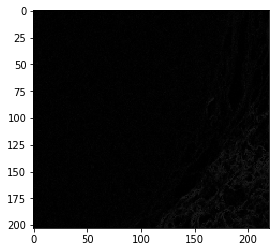

New max found at scale (0.595, 0.595) and translation (95.000, 104.000)
Ranges: (95, 104, 203, 219) (0, 0, 305, 305)
Overlap pixels: (203, 219)
MI: 0.0864 	AMI: 0.0089


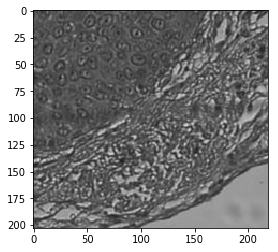

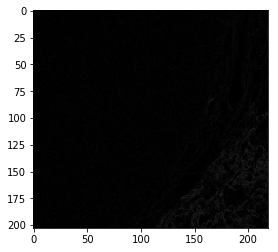

New max found at scale (0.595, 0.595) and translation (95.000, 105.000)
Ranges: (95, 105, 203, 218) (0, 0, 305, 305)
Overlap pixels: (203, 218)
MI: 0.0865 	AMI: 0.0089


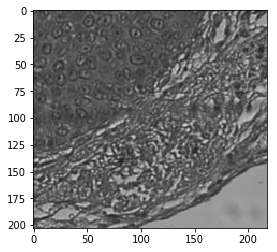

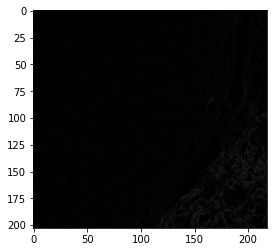

New max found at scale (0.595, 0.595) and translation (96.000, 103.000)
Ranges: (96, 103, 202, 220) (0, 0, 305, 305)
Overlap pixels: (202, 220)
MI: 0.0873 	AMI: 0.0091


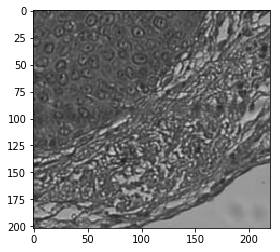

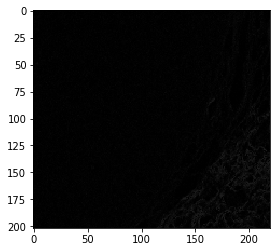

New max found at scale (0.595, 0.595) and translation (96.000, 104.000)
Ranges: (96, 104, 202, 219) (0, 0, 305, 305)
Overlap pixels: (202, 219)
MI: 0.0881 	AMI: 0.0093


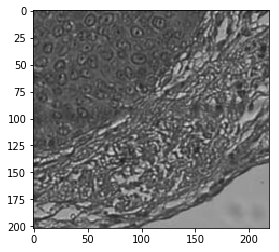

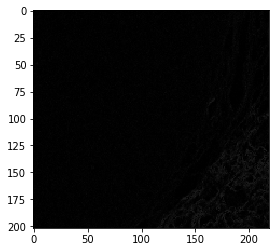

New max found at scale (0.595, 0.595) and translation (96.000, 106.000)
Ranges: (96, 106, 202, 217) (0, 0, 305, 305)
Overlap pixels: (202, 217)
MI: 0.0892 	AMI: 0.0095


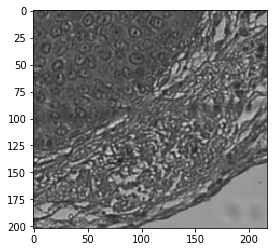

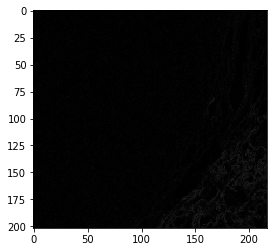

New max found at scale (0.595, 0.595) and translation (97.000, 104.000)
Ranges: (97, 104, 201, 219) (0, 0, 305, 305)
Overlap pixels: (201, 219)
MI: 0.0894 	AMI: 0.0095


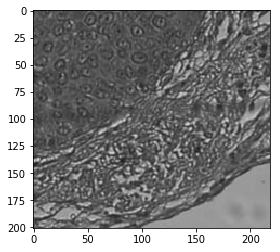

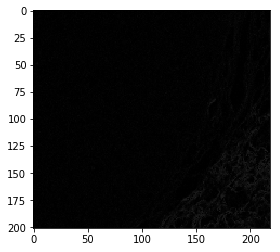

New max found at scale (0.595, 0.595) and translation (97.000, 105.000)
Ranges: (97, 105, 201, 218) (0, 0, 305, 305)
Overlap pixels: (201, 218)
MI: 0.0898 	AMI: 0.0096


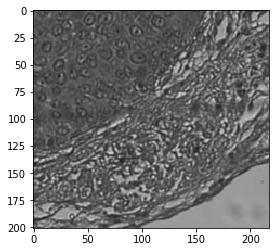

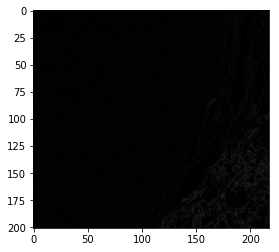

New max found at scale (0.595, 0.595) and translation (97.000, 106.000)
Ranges: (97, 106, 201, 217) (0, 0, 305, 305)
Overlap pixels: (201, 217)
MI: 0.0903 	AMI: 0.0097


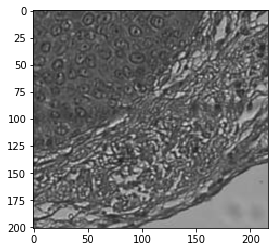

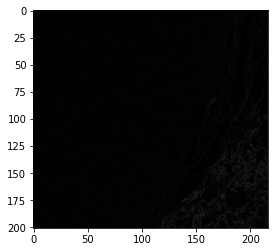

At grid point 51000 (20.0%): scale (0.595, 0.595), translation (98, 94). MI=0.077, AMI=0.007
New max found at scale (0.595, 0.595) and translation (98.000, 101.000)
Ranges: (98, 101, 200, 222) (0, 0, 305, 305)
Overlap pixels: (200, 222)
MI: 0.0902 	AMI: 0.0097


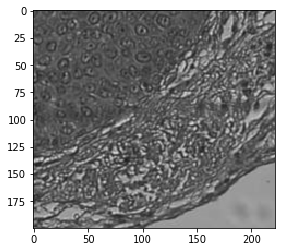

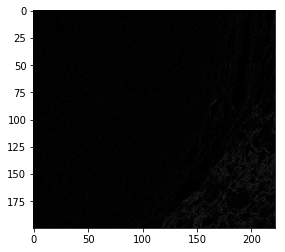

New max found at scale (0.595, 0.595) and translation (98.000, 105.000)
Ranges: (98, 105, 200, 218) (0, 0, 305, 305)
Overlap pixels: (200, 218)
MI: 0.0911 	AMI: 0.0098


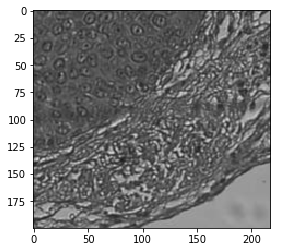

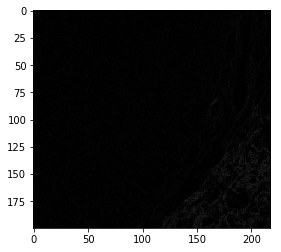

New max found at scale (0.595, 0.595) and translation (98.000, 106.000)
Ranges: (98, 106, 200, 217) (0, 0, 305, 305)
Overlap pixels: (200, 217)
MI: 0.0912 	AMI: 0.0098


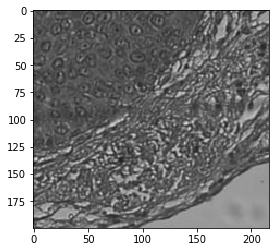

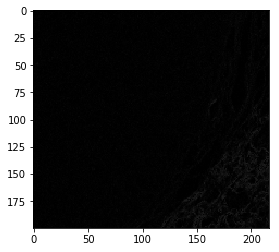

At grid point 52000 (20.4%): scale (0.617, 0.617), translation (-2, 41). MI=0.050, AMI=0.005
At grid point 53000 (20.8%): scale (0.617, 0.617), translation (6, 105). MI=0.070, AMI=0.008
At grid point 54000 (21.2%): scale (0.617, 0.617), translation (15, 52). MI=0.046, AMI=0.004
At grid point 55000 (21.6%): scale (0.617, 0.617), translation (24, -1). MI=0.038, AMI=0.003
At grid point 56000 (22.0%): scale (0.617, 0.617), translation (32, 63). MI=0.049, AMI=0.004
At grid point 57000 (22.3%): scale (0.617, 0.617), translation (41, 10). MI=0.037, AMI=0.002
At grid point 58000 (22.7%): scale (0.617, 0.617), translation (49, 74). MI=0.054, AMI=0.004
At grid point 59000 (23.1%): scale (0.617, 0.617), translation (58, 21). MI=0.039, AMI=0.002
New max found at scale (0.617, 0.617) and translation (62.000, 106.000)
Ranges: (62, 106, 236, 217) (0, 0, 316, 316)
Overlap pixels: (236, 217)
MI: 0.0873 	AMI: 0.0101


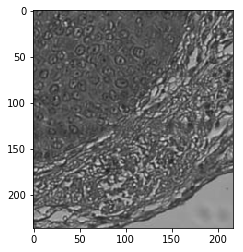

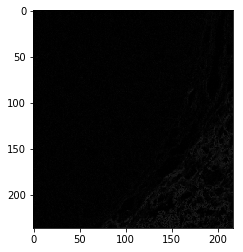

At grid point 60000 (23.5%): scale (0.617, 0.617), translation (66, 85). MI=0.067, AMI=0.006
At grid point 61000 (23.9%): scale (0.617, 0.617), translation (75, 32). MI=0.042, AMI=0.002
At grid point 62000 (24.3%): scale (0.617, 0.617), translation (83, 96). MI=0.074, AMI=0.007
At grid point 63000 (24.7%): scale (0.617, 0.617), translation (92, 43). MI=0.043, AMI=0.001
New max found at scale (0.617, 0.617) and translation (94.000, 92.000)
Ranges: (94, 92, 204, 231) (0, 0, 316, 316)
Overlap pixels: (204, 231)
MI: 0.0901 	AMI: 0.0103


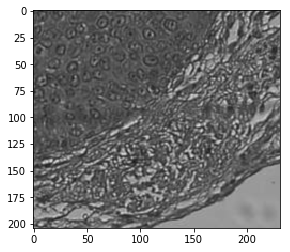

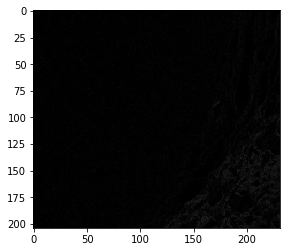

New max found at scale (0.617, 0.617) and translation (94.000, 93.000)
Ranges: (94, 93, 204, 230) (0, 0, 316, 316)
Overlap pixels: (204, 230)
MI: 0.0904 	AMI: 0.0103


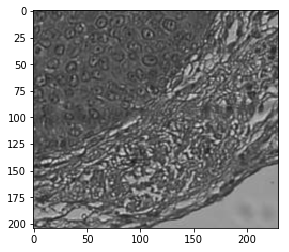

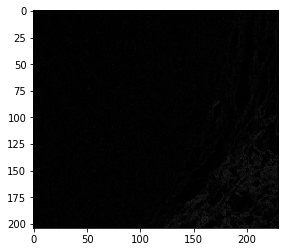

New max found at scale (0.617, 0.617) and translation (94.000, 96.000)
Ranges: (94, 96, 204, 227) (0, 0, 316, 316)
Overlap pixels: (204, 227)
MI: 0.0912 	AMI: 0.0104


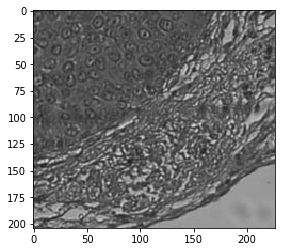

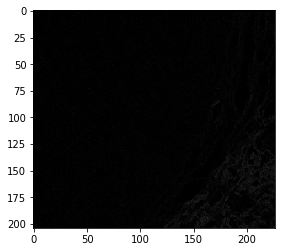

New max found at scale (0.617, 0.617) and translation (95.000, 96.000)
Ranges: (95, 96, 203, 227) (0, 0, 316, 316)
Overlap pixels: (203, 227)
MI: 0.0914 	AMI: 0.0104


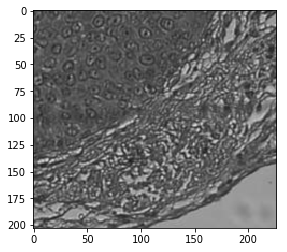

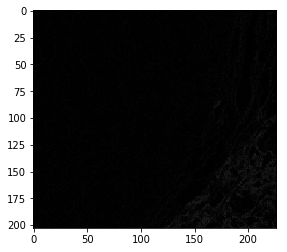

New max found at scale (0.617, 0.617) and translation (95.000, 98.000)
Ranges: (95, 98, 203, 225) (0, 0, 316, 316)
Overlap pixels: (203, 225)
MI: 0.0920 	AMI: 0.0105


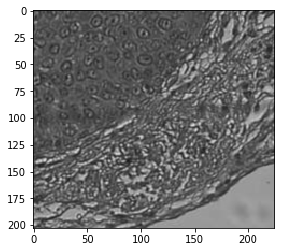

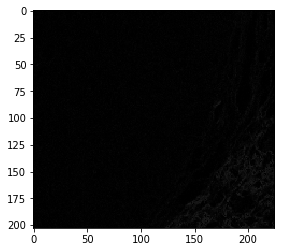

New max found at scale (0.617, 0.617) and translation (96.000, 91.000)
Ranges: (96, 91, 202, 232) (0, 0, 316, 316)
Overlap pixels: (202, 232)
MI: 0.0918 	AMI: 0.0106


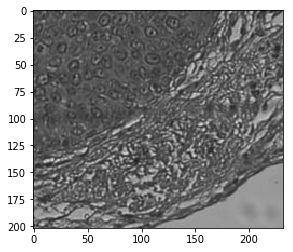

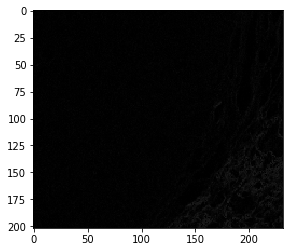

New max found at scale (0.617, 0.617) and translation (96.000, 97.000)
Ranges: (96, 97, 202, 226) (0, 0, 316, 316)
Overlap pixels: (202, 226)
MI: 0.0921 	AMI: 0.0106


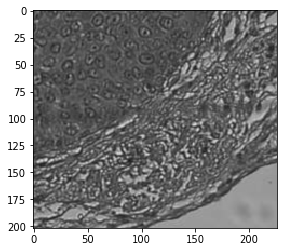

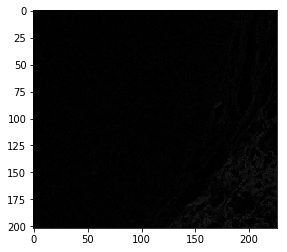

New max found at scale (0.617, 0.617) and translation (97.000, 92.000)
Ranges: (97, 92, 201, 231) (0, 0, 316, 316)
Overlap pixels: (201, 231)
MI: 0.0930 	AMI: 0.0108


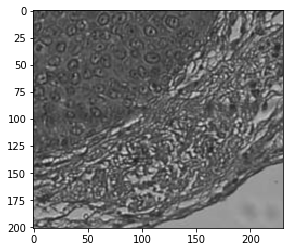

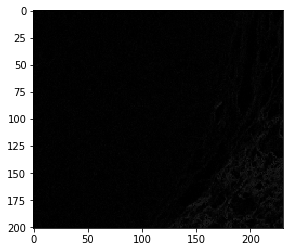

New max found at scale (0.617, 0.617) and translation (98.000, 92.000)
Ranges: (98, 92, 200, 231) (0, 0, 316, 316)
Overlap pixels: (200, 231)
MI: 0.0930 	AMI: 0.0108


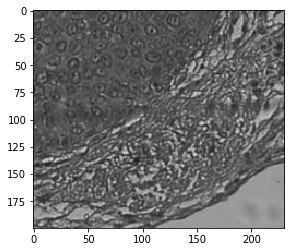

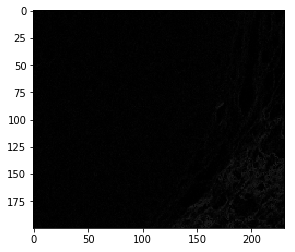

At grid point 64000 (25.1%): scale (0.639, 0.639), translation (-8, -10). MI=0.040, AMI=0.003
At grid point 65000 (25.5%): scale (0.639, 0.639), translation (0, 54). MI=0.047, AMI=0.004
At grid point 66000 (25.9%): scale (0.639, 0.639), translation (9, 1). MI=0.039, AMI=0.003
At grid point 67000 (26.3%): scale (0.639, 0.639), translation (17, 65). MI=0.050, AMI=0.004
At grid point 68000 (26.7%): scale (0.639, 0.639), translation (26, 12). MI=0.038, AMI=0.003
At grid point 69000 (27.1%): scale (0.639, 0.639), translation (34, 76). MI=0.056, AMI=0.005
At grid point 70000 (27.4%): scale (0.639, 0.639), translation (43, 23). MI=0.040, AMI=0.002
At grid point 71000 (27.8%): scale (0.639, 0.639), translation (51, 87). MI=0.070, AMI=0.007
At grid point 72000 (28.2%): scale (0.639, 0.639), translation (60, 34). MI=0.041, AMI=0.002
At grid point 73000 (28.6%): scale (0.639, 0.639), translation (68, 98). MI=0.067, AMI=0.006
At grid point 74000 (29.0%): scale (0.639, 0.639), translation (77, 45).

At grid point 152000 (59.6%): scale (0.771, 0.771), translation (90, 6). MI=0.063, AMI=0.007
At grid point 153000 (60.0%): scale (0.771, 0.771), translation (98, 70). MI=0.058, AMI=0.006
At grid point 154000 (60.4%): scale (0.793, 0.793), translation (-2, 17). MI=0.046, AMI=0.005
At grid point 155000 (60.8%): scale (0.793, 0.793), translation (6, 81). MI=0.063, AMI=0.008
At grid point 156000 (61.2%): scale (0.793, 0.793), translation (15, 28). MI=0.051, AMI=0.005
At grid point 157000 (61.6%): scale (0.793, 0.793), translation (23, 92). MI=0.067, AMI=0.008
At grid point 158000 (61.9%): scale (0.793, 0.793), translation (32, 39). MI=0.053, AMI=0.006
At grid point 159000 (62.3%): scale (0.793, 0.793), translation (40, 103). MI=0.058, AMI=0.007
At grid point 160000 (62.7%): scale (0.793, 0.793), translation (49, 50). MI=0.064, AMI=0.008
At grid point 161000 (63.1%): scale (0.793, 0.793), translation (58, -3). MI=0.041, AMI=0.003
At grid point 162000 (63.5%): scale (0.793, 0.793), translati

At grid point 240000 (94.1%): scale (0.924, 0.924), translation (79, 22). MI=0.037, AMI=0.003
At grid point 241000 (94.5%): scale (0.924, 0.924), translation (87, 86). MI=0.016, AMI=0.000
At grid point 242000 (94.9%): scale (0.924, 0.924), translation (96, 33). MI=0.024, AMI=0.001
At grid point 243000 (95.3%): scale (0.946, 0.946), translation (-5, 97). MI=0.027, AMI=0.002
At grid point 244000 (95.7%): scale (0.946, 0.946), translation (4, 44). MI=0.051, AMI=0.007
At grid point 245000 (96.1%): scale (0.946, 0.946), translation (13, -9). MI=0.048, AMI=0.006
At grid point 246000 (96.4%): scale (0.946, 0.946), translation (21, 55). MI=0.031, AMI=0.003
At grid point 247000 (96.8%): scale (0.946, 0.946), translation (30, 2). MI=0.053, AMI=0.007
At grid point 248000 (97.2%): scale (0.946, 0.946), translation (38, 66). MI=0.018, AMI=0.001
At grid point 249000 (97.6%): scale (0.946, 0.946), translation (47, 13). MI=0.056, AMI=0.007
At grid point 250000 (98.0%): scale (0.946, 0.946), translatio

In [6]:
def gridSearchMIRegister(ref, flo):
    mi_scores=[]
    ami_scores=[]
    max_mi = -1
    max_ami = -1
    ctr=0

        
    plt.imshow(ref, cmap='gray', vmin=0, vmax=255)
    plt.title("Reference image")
    plt.show()
    plt.imshow(flo, cmap='gray', vmin=0, vmax=255)
    plt.title("Floating image")
    plt.show()

    flo2 = Image.fromarray(flo, mode='L') #Make a copy rather than affecting the passed in data, also convert to an Image
    
    init_scaling = np.array([len(ref)/len(flo), len(ref[0])/len(flo[0])]) #initialise scaling by assuming whole region is covered
    init_transl = [0, 0] #initialise translation as zero
    
    #Set up search grid
    max_scaling = init_scaling * 1.5
    min_scaling = init_scaling / 1.1 #The MPM region shouldn't be much (any) bigger than the cut-out
    scaling_steps = 20
#     print('Scaling grid from (%.3f,%.3f) to (%.3f,%.3f) in %d steps'%(*min_scaling, *max_scaling, scaling_steps))
    
    max_transl = [ref.shape[0]//3, ref.shape[1]//3]
    min_transl = [-10, -10] # negative translation truncates the floating image but we expect it to be wholly contained within the reference image so keep this small
#     transl_steps = 40
#     xtrans = np.rint(np.linspace(min_transl[0], max_transl[0], transl_steps)).astype(int)
#     ytrans = np.rint(np.linspace(min_transl[1], max_transl[1], transl_steps)).astype(int)
    #Test every whole-pixel translation within the bounds given
    xtrans = np.arange(min_transl[0], max_transl[0])
    ytrans = np.arange(min_transl[1], max_transl[1])
    
#     xscaling = np.linspace(min_scaling[0], max_scaling[0], scaling_steps)
#     yscaling = np.linspace(min_scaling[1], max_scaling[1], scaling_steps)
    xscaling = np.linspace(min(min_scaling), max(max_scaling), scaling_steps)

    pts = len(xscaling)*len(xtrans)*len(ytrans)#*len(yscaling)
    print("Finding maximum MI on a grid of (%d x %d x %d) = %d points"%\
          (len(xscaling), len(xtrans), len(ytrans), \
           pts))
    for x in xscaling:
        #Make x and y scaling the same to reduce grid size by a factor of scaling_steps (currently 20)
        y = x
#         for y in yscaling:

        newsize = np.rint((x * len(flo), y * len(flo[0]))).astype(int)
        rescaled_flo = flo2.resize(newsize)
#             print("Calculating MI with scaling (%.3f, %.3f) giving flo image size %r"%(x, y, newsize))
        rescaled_flo = np.asarray(rescaled_flo)
#             plt.imshow(rescaled_flo, cmap='gray', vmin=0, vmax=255)
#             plt.title("Rescaled floating image")
#             plt.show()
#             print(rescaled_flo.shape)

        for xt in xtrans:
            for yt in ytrans:
#                     print("Translating by (%d, %d)"%(xt, yt))
#                     transformed_flo = np.zeros((newsize[1], newsize[0]))
                if xt > 0 and yt > 0:
                    ref_range = (xt, yt, ref.shape[0]-xt, ref.shape[1]-yt)
                    flo_range = (0, 0, rescaled_flo.shape[0], rescaled_flo.shape[1])
#                         transformed_flo[xt:,yt:] = rescaled_flo[:-xt,:-yt]
                elif xt > 0:
                    ref_range = (xt, 0, ref.shape[0]-xt, ref.shape[1])
                    flo_range = (0, -yt, rescaled_flo.shape[0], rescaled_flo.shape[1]+yt)
#                         transformed_flo[xt:,:yt] = rescaled_flo[:-xt,-yt:]
                elif yt > 0:
                    ref_range = (0, yt, ref.shape[0], ref.shape[1]-yt)
                    flo_range = (-xt, 0, rescaled_flo.shape[0]+xt, rescaled_flo.shape[1])
#                         transformed_flo[:xt,yt:] = rescaled_flo[-xt:,:-yt]
                else:
                    ref_range = (0, 0, ref.shape[0], ref.shape[1])
                    flo_range = (-xt, -yt, rescaled_flo.shape[0]+xt, rescaled_flo.shape[1]+yt)
#                         transformed_flo[:xt,:yt] = rescaled_flo[-xt:,-yt:]
#                     plt.imshow(transformed_flo, cmap='gray', vmin=0, vmax=255)
#                     plt.show()

#                     overlap = (min(transformed_flo.shape[0], ref.shape[0]), min(transformed_flo.shape[1], ref.shape[1]))
                overlap = (min(ref_range[2], flo_range[2]), min(ref_range[3], flo_range[3]))

                mi = mutual_info_score(ref[ref_range[0]:(overlap[0]+ref_range[0]), ref_range[1]:(overlap[1]+ref_range[1])].flatten(), \
                                       rescaled_flo[flo_range[0]:(overlap[0]+flo_range[0]), flo_range[1]:(overlap[1]+flo_range[1])].flatten())
                ami = adjusted_mutual_info_score(ref[ref_range[0]:(overlap[0]+ref_range[0]), ref_range[1]:(overlap[1]+ref_range[1])].flatten(), \
                                       rescaled_flo[flo_range[0]:(overlap[0]+flo_range[0]), flo_range[1]:(overlap[1]+flo_range[1])].flatten())
#                     print("MI score is: %.4f"%mi)
                if mi > max_mi or ami > max_ami:
                    if mi > max_mi:
                        max_mi = mi
                        mi_max_at = (x, y, xt, yt)
                    if ami > max_ami:
                        max_ami = ami
                        ami_max_at = (x, y, xt, yt)
                    print("New max found at scale (%.3f, %.3f) and translation (%.3f, %.3f)"%(x, y, xt, yt))
                    print('Ranges:', ref_range, flo_range)
                    print('Overlap pixels:',overlap)
                    print('MI: %.4f \tAMI: %.4f'%(mi, ami))
                    plt.imshow(ref[ref_range[0]:(overlap[0]+ref_range[0]), ref_range[1]:(overlap[1]+ref_range[1])], cmap='gray', vmin=0, vmax=255)
                    plt.show()
                    plt.imshow(rescaled_flo[flo_range[0]:(overlap[0]+flo_range[0]), flo_range[1]:(overlap[1]+flo_range[1])], cmap='gray', vmin=0, vmax=255)
                    plt.show()
                mi_scores.append(mi)
                ami_scores.append(ami)

                ctr += 1
                if not ctr%1000:
                    print('At grid point %d (%2.1f%%): scale (%.3f, %.3f), translation (%d, %d). MI=%.3f, AMI=%.3f'%(ctr, 100*ctr/pts, x, y, xt, yt, mi, ami))
        
    return mi_scores, mi_max_at, ami_scores, ami_max_at
    
mi_scores, mi_max_at, ami_scores, ami_max_at = gridSearchMIRegister(ref_im, flo_im)

Best so far at 28.6% of old grid (terminated at 29.2%) (bidirectional scaling: init_scaling * 1.5 to init_scaling / 1.5 in 20 steps each way; translation: ref_shape/3 either way in 40 steps):
- New max found at scale (0.516, 0.808) and translation (79.000, 107.000)
- Ranges: (79, 107, 219, 216) (0, 0, 414, 264)
- Overlap pixels: (219, 216)
- MI: 0.0854 	AMI: 0.0096

Best on new grid (single scaling: init_scaling * 1.1 to init_scaling / 1.5 in 20 steps; translation: ref_shape/3 either way in 40 steps)
- New max found at scale (0.613, 0.613) and translation (99.000, 101.000)
- Ranges: (99, 101, 199, 222) (0, 0, 314, 314)
- Overlap pixels: (199, 222)
- MI: 0.0925 	AMI: 0.0105

Best on next grid (single scaling: init_scaling * 1.1 to init_scaling / 1.5 in 20 steps; translation: -10 to ref_shape/3 either way in one-pixel steps)
- New max found at scale (0.630, 0.630) and translation (96.000, 104.000)
- Ranges: (96, 104, 202, 219) (0, 0, 322, 322)
- Overlap pixels: (202, 219)
- MI: 0.0937 	AMI: 0.0110

Best on next grid (single scaling: init_scaling / 1.1 to init_scaling * 1.5 in 20 steps; translation: -10 to ref_shape/3 either way in one-pixel steps)
- Doh, think it was the right way around before.
- New max found at scale (0.617, 0.617) and translation (98.000, 92.000)
- Ranges: (98, 92, 200, 231) (0, 0, 316, 316)
- Overlap pixels: (200, 231)
- MI: 0.0930 	AMI: 0.0108


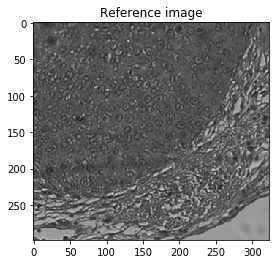

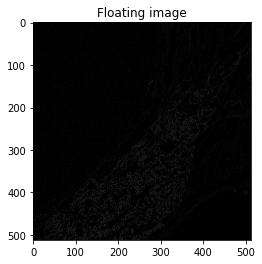

TypeError: 'NoneType' object is not iterable

In [7]:
def gradDescentMIRegister(ref, flo):
    plt.imshow(ref, cmap='gray', vmin=0, vmax=255)
    plt.title("Reference image")
    plt.show()
    plt.imshow(flo, cmap='gray', vmin=0, vmax=255)
    plt.title("Floating image")
    plt.show()

    flo2 = Image.fromarray(flo, mode='L') #Make a copy rather than affecting the passed in data, also convert to an Image
    
    
    init_scaling = np.array([len(ref)/len(flo), len(ref[0])/len(flo[0])]) #initialise scaling by assuming whole region is covered
    init_transl = [0, 0] #initialise translation as zero
    init_params = np.append(init_scaling, init_transl)
    
    #Set up boundaries for parameters
    max_scaling = max(init_scaling * 1.1) #The MPM region shouldn't be much (any) bigger than the cut-out
    min_scaling = min(init_scaling / 1.5)
    max_transl = [ref.shape[0]//3, ref.shape[1]//3]
    min_transl = [-10, -10] # negative translation truncates the floating image but we expect it to be wholly contained within the reference image so keep this small
    
    
    
def getOverlapRegion(flo, ref, trans):
    '''
    Apply transform of trans=[scale, xtransl, ytransl] to floating image flo 
    and return the parts of flo and ref that overlap
    '''
    newsize = np.rint((trans[0] * len(flo), trans[0] * len(flo[0]))).astype(int)
    rescaled_flo = flo2.resize(newsize)
    rescaled_flo = np.asarray(rescaled_flo)

    if trans[1] > 0 and trans[2] > 0:
        ref_range = (trans[1], trans[2], ref.shape[0]-trans[1], ref.shape[1]-trans[2])
        flo_range = (0, 0, rescaled_flo.shape[0], rescaled_flo.shape[1])
    elif trans[1] > 0:
        ref_range = (trans[1], 0, ref.shape[0]-trans[1], ref.shape[1])
        flo_range = (0, -trans[2], rescaled_flo.shape[0], rescaled_flo.shape[1]+trans[2])
    elif trans[2] > 0:
        ref_range = (0, trans[2], ref.shape[0], ref.shape[1]-trans[2])
        flo_range = (-trans[1], 0, rescaled_flo.shape[0]+trans[1], rescaled_flo.shape[1])
    else:
        ref_range = (0, 0, ref.shape[0], ref.shape[1])
        flo_range = (-trans[1], -trans[2], rescaled_flo.shape[0]+trans[1], rescaled_flo.shape[1]+trans[2])

    overlap = (min(ref_range[2], flo_range[2]), min(ref_range[3], flo_range[3]))
    
    return ref[ref_range[0]:(overlap[0]+ref_range[0]), ref_range[1]:(overlap[1]+ref_range[1])], \
            rescaled_flo[flo_range[0]:(overlap[0]+flo_range[0]), flo_range[1]:(overlap[1]+flo_range[1])]



def mi_fun(flo, ref, trans):
    ref_overlap, flo_overlap = getOverlapRegion(flo, trans, ref)
#     mi = mutual_info_score(ref_overlap.flatten(), \
#                            flo_overlap.flatten())
    ami = adjusted_mutual_info_score(ref_overlap.flatten(), \
                           flo_overlap.flatten())
#   print("Translation %r: AMI score is: %.4f"%(trans, ami))
#     if mi > max_mi or ami > max_ami:
#         if mi > max_mi:
#             max_mi = mi
#             mi_max_at = (x, y, xt, yt)
#         if ami > max_ami:
#             max_ami = ami
#             ami_max_at = (x, y, xt, yt)
#         print("New max found at scale (%.3f, %.3f) and translation (%.3f, %.3f)"%(x, y, xt, yt))
#         print('Ranges:', ref_range, flo_range)
#         print('Overlap pixels:',overlap)
#         print('MI: %.4f \tAMI: %.4f'%(mi, ami))
#         plt.imshow(ref[ref_range[0]:(overlap[0]+ref_range[0]), ref_range[1]:(overlap[1]+ref_range[1])], cmap='gray', vmin=0, vmax=255)
#         plt.show()
#         plt.imshow(rescaled_flo[flo_range[0]:(overlap[0]+flo_range[0]), flo_range[1]:(overlap[1]+flo_range[1])], cmap='gray', vmin=0, vmax=255)
#         plt.show()
        
    return ami
    
    
mi_scores, mi_max_at, ami_scores, ami_max_at = gradDescentMIRegister(ref_im, flo_im)

In [ ]:
cutout_locations

In [ ]:
gt_positions

Convert the ground truth data into what we would expect to get as outcome from maximising the MI, i.e. the location  and scale of the MPM region within the cut-out image

The location is the difference between the top left coordinates of the ground truth (gt_positions) and the top left of the cut-out region (which should always be further up and left than the gt position since the cut-out region was chosen to fully include the roi).

The scale is the ratio of the marked roi (gt) to the size of the MPM images which is always 512 square.

In [ ]:
gt_dict = {str(g[0])+'_'+str(g[1]):g[2:] for g in gt_positions}
cutout_dict = {str(c[0])+'_'+str(c[1]):c[2:] for c in cutout_locations}

In [ ]:
gt={}
for key in gt_dict.keys():
    if key in cutout_dict:
        gt[key] = np.append(gt_dict[key][:2] - cutout_dict[key][:2], gt_dict[key][-2:]/512.)

In [ ]:
gt